## Python implementation of `u8vec_fill_rnd_distr`
- Expected random uniform distribution $\in [0, 255]$

- C implementaiton used for arithmeticcoding in folder `../src/utils/vec.c`

In [3]:
import numpy as np
import matplotlib.pyplot as plt

def u8vec_fill_rnd_distr(n, cap):
    assert n <= cap, "n should be less than or equal to cap"
    
    r = np.zeros(257, dtype=np.uint32) 
    tot, cum = 0, 0

    for i in range(1, 256):
        x = np.random.randint(0, 0x7fffffff)
        r[i] = ((x & 0xff0) >> 4) << (x & 0xf)  
        tot += r[i]

    for i in range(1, 256):
        cum += r[i]
        r[i] = np.uint64(cum * 0x7fffffff) // tot  

    vec = np.zeros(n, dtype=np.uint8)

    for i in range(n):
        x = np.random.randint(0, 0x7fffffff)
        lb_idx, ub_idx = 0, 256

        for _ in range(8):
            mid_idx = (lb_idx + ub_idx) >> 1
            mid_int = r[mid_idx]
            if mid_int > x:
                ub_idx = mid_idx
            else:
                lb_idx = mid_idx

        assert ub_idx - lb_idx == 1
        vec[i] = lb_idx

    return vec

In [4]:
# Parameters
n = 256  # Number of random values to generate each time
cap = 256  # Capacity of the vector
iterations = 10000  # Number of times to call the function

all_values = []

for _ in range(iterations):
    vec = u8vec_fill_rnd_distr(n, cap)
    print(vec)
    print('\n --- \n')
    all_values.extend(vec)

[120 109 129 221 218 198 156 221 221 214   0 109   0 109 134 207 125  83
 207 109 121 211 124  21 164  21 118  13 203 203 207 104 124  47 156 164
 203  38 211 129 164 212  68  57 214  17 118  21 109   6 121 120 124 233
 114 129 245 211 158 133 118  88 120 219 124  47 156 214 160  45  47 109
 212  88  45  88  38   1  25 143 120 129 104 124 124 120  52 120 223 164
 129   1 152 179 124 254 211 214 214 214  31 214 207 124 129 211 109  88
 156  28 124 118 218 109 104 214 164 124 134 125 124 211 109 221   1 168
 245 109 172 124  57 101 109  88 121 102 133 125 129 129 214 221 211 214
 152 104 254  28  25 134 129 124 164 125  14  60  14 114 102  31 207 212
 214   0 129  31 151  50 129 129 214  21 164 241 109  97  21 134 211 218
 221  17 214 109 124 118 104 156  36  83 104 241 254  31   8 124 211 104
 219 129 129 203 179 164 210 223 156 233  88 203 218 203 233  88 104  21
 134  88  82 124  93  45 118 129 121  21  88 234   1 160 115 120 129 114
  88 160 124 221 120 221 230 221  25  88 129  31  8

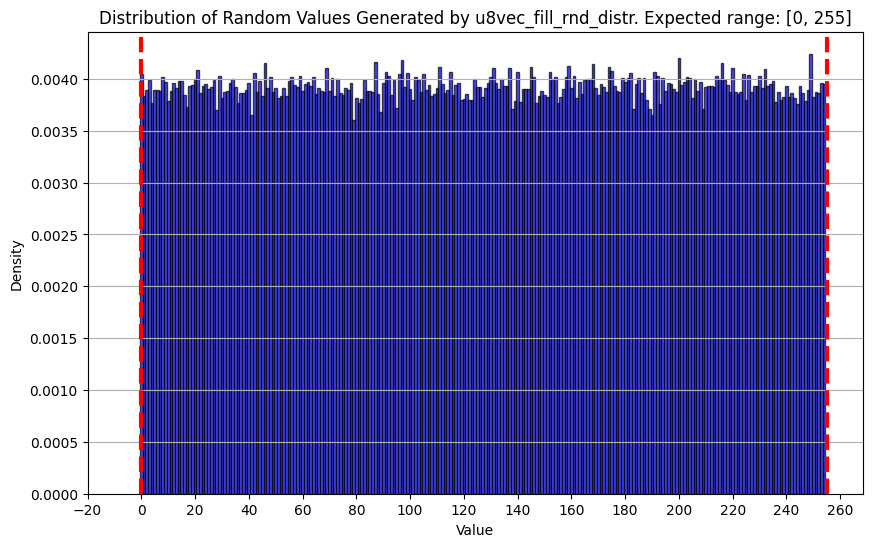

In [5]:
# Plot
plt.figure(figsize=(10, 6))
plt.hist(all_values, bins=np.arange(257) - 0.5, density=True, alpha=0.7, color='blue', edgecolor='black')

plt.axvline(x=0, color='red', linestyle='--', linewidth=3)      # Lower bound
plt.axvline(x=cap - 1, color='red', linestyle='--', linewidth=3)    # Upper bound

plt.title('Distribution of Random Values Generated by u8vec_fill_rnd_distr. Expected range: [0, ' + str(cap - 1) + ']')
plt.xlabel('Value')
plt.ylabel('Density')

tick_values = np.arange(-20, 275, 20)
plt.xticks(tick_values)

plt.grid(axis='y')

# save plot as pdf
plt.savefig('u8vec_fill_rnd_distr.pdf')

plt.show()



In [7]:
# Chi-squared test to check if the distribution is uniform

from scipy.stats import chisquare

alpha = 0.05

observed, _ = np.histogram(all_values, bins=np.arange(cap + 1))  
expected = np.full(cap, fill_value=(n * iterations) / cap) 

chi2, p = chisquare(observed, expected)

print(f"Chi-squared: {chi2:.2f}, p-value: {p:.4f}\n")

if p < alpha:
    print("The distribution is not uniform.")
else:
    print("The distribution is uniform.")

Chi-squared: 11878.73, p-value: 0.0000

The distribution is not uniform.


In [8]:
# Kolmogorov-Smirnov Test to check if the data is uniformly distributed

from scipy import stats

d, p = stats.kstest(all_values, 'uniform', args=(0, 1))

print(f"Kolmogorov-Smirnov Test: {d}, P-value: {p}\n")

if p < alpha:
    print("The distribution is not uniform.")
else:
    print("The distribution is uniform.")


Kolmogorov-Smirnov Test: 0.99595390625, P-value: 0.0

The distribution is not uniform.
